# NETW 1013 Clustering Project 

**Objective:** 
The objective of this project is to teach students how to apply clustering to real datasets.

You should be able to answer the following questions and provide reasonable justification for your answers: 
* Which clustering approach have you decided to use on each dataset? 
* Compare between Kmeans, Hierarchal and DBScan.
* Discuss how you tuned your clustering hyperparameters to achieve the best cluster assignment?
* What is the effect of different distance functions on the calculated clusters?
* How did you evaluate the performance of different clustering techniques on different datatsets?
* Visualize your output where applicable.
* What is the effect of scaling on the performance of clustering techniques? 

 
 



Running this project requires the following imports:

In [19]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans

from sklearn.metrics import silhouette_score

%matplotlib inline
# Please refer to the sklearn documentation to learn more about the different parameters for each clustering technique.

In [262]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = ['b', 'r', 'g', 'c', 'm', 'y', 'k', 'orange', 'purple', 'brown', 'pink']
    alpha = 0.5  
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The dataset generated below is known to be best clustered into 6 clusters.
* Cluster the data set below using the three different clustering techniques discussed in the course.
* Visualize your clustering output in each step of your work.



In [264]:
#Data Generation and Visualization
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data. 
* Display the outcome of each value of K. 
* Plot distortion function versus K and choose the approriate value of K. 
* Plot the silhouette_score versus K and use it to choose the best K. 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 
* Comment on the effect of centroid initialization on cluster assignment. 
* Hint: Lookup k-means++ .

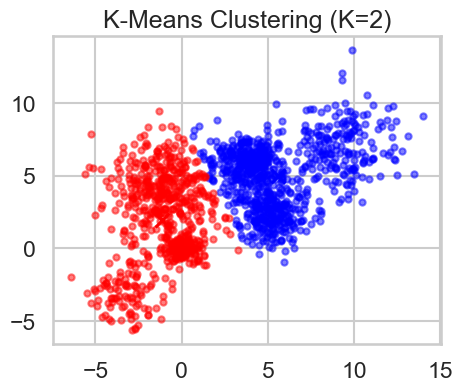

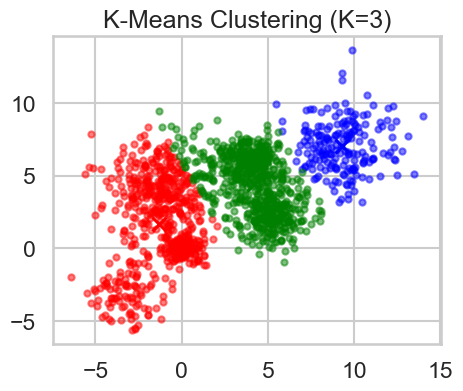

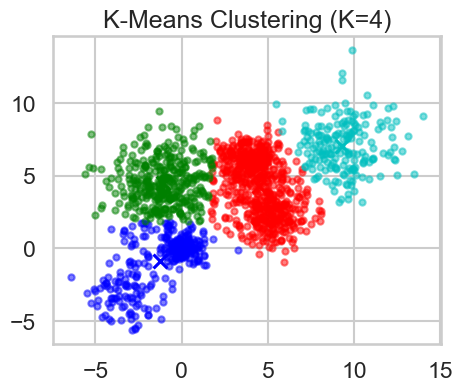

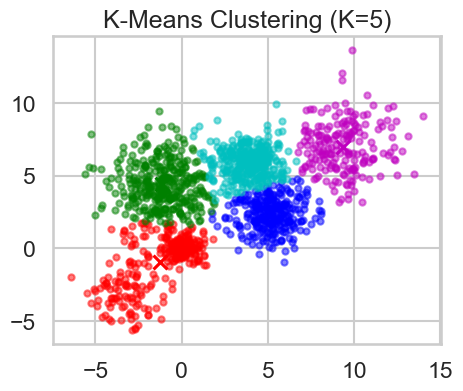

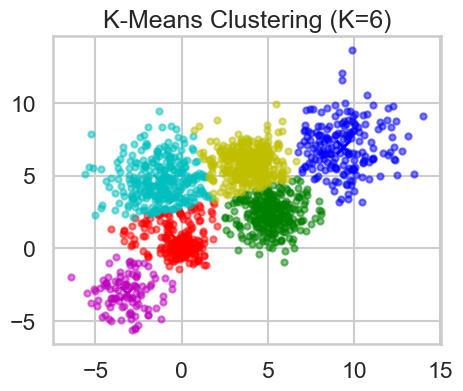

...

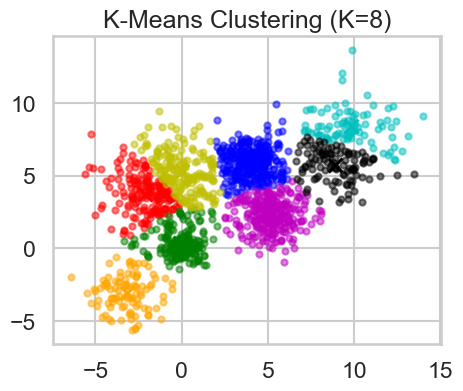

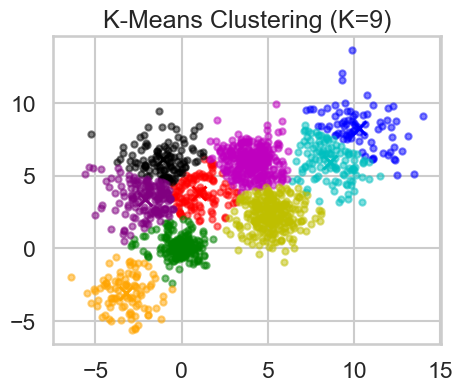

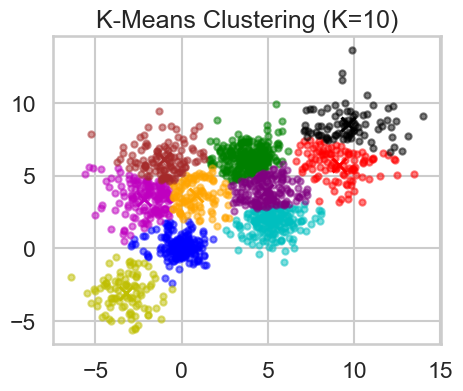

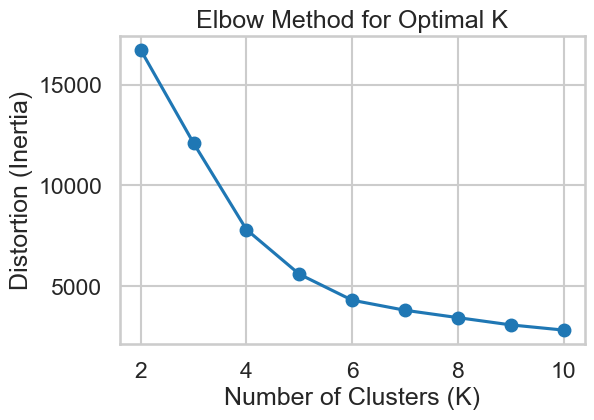

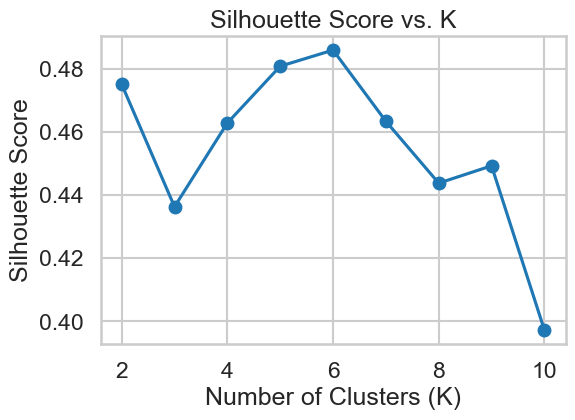

Best K (based on Silhouette Score): 6


In [46]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Define range for K
k_values = range(2, 11)

# Store distortion and silhouette scores
distortions = []
silhouette_scores = []

# Loop over different values of K
for k in k_values:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
    kmeans.fit(Multi_blob_Data)

    # Compute and store the distortion (inertia)
    distortions.append(kmeans.inertia_)

    # Compute and store the silhouette score
    silhouette_avg = silhouette_score(Multi_blob_Data, kmeans.labels_)
    silhouette_scores.append(silhouette_avg)

    # Display clusters using the helper function
    plt.figure(figsize=(5, 4))
    display_cluster(Multi_blob_Data, kmeans, num_clusters=k)
    plt.title(f'K-Means Clustering (K={k})')
    plt.show()

# Plot distortion function vs. K
plt.figure(figsize=(6, 4))
plt.plot(k_values, distortions, marker='o', linestyle='-')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Distortion (Inertia)')
plt.title('Elbow Method for Optimal K')
plt.show()

# Plot silhouette scores vs. K
plt.figure(figsize=(6, 4))
plt.plot(k_values, silhouette_scores, marker='o', linestyle='-')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. K')
plt.show()

# Find best K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
print(f"Best K (based on Silhouette Score): {best_k}")


### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data.
* In the  AgglomerativeClustering change the following parameters:
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage(try different options)
    * Distance_threshold (try different options)
* Plot the dendrograph for one trial.
* For each of these trials, calculate the silhouette_score and display the resulting clusters.  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 


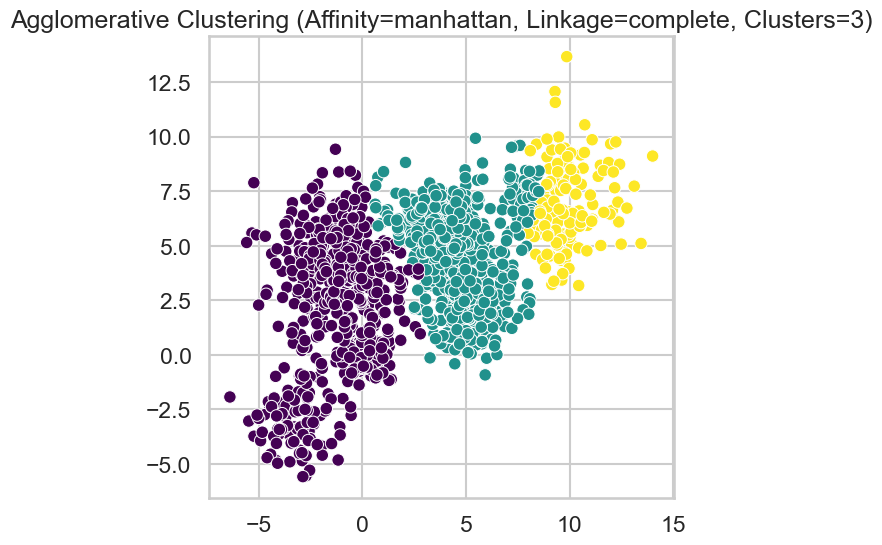

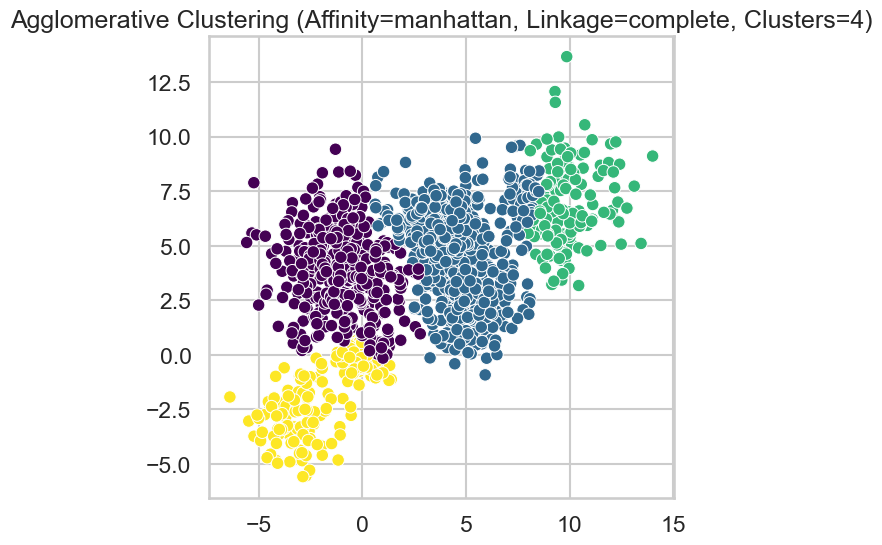

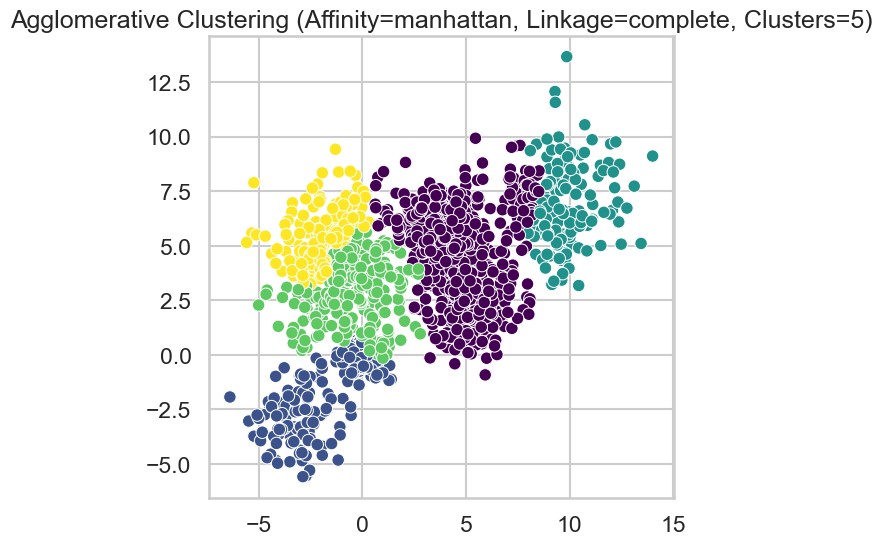

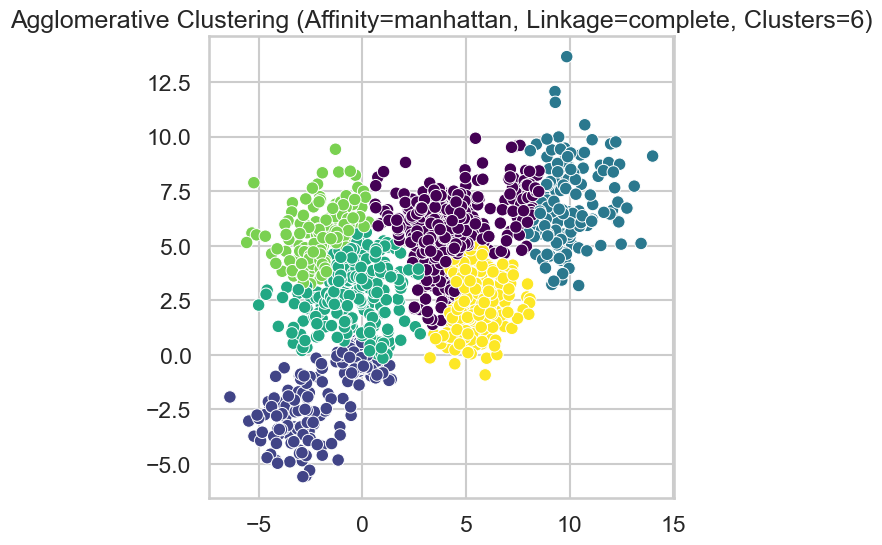

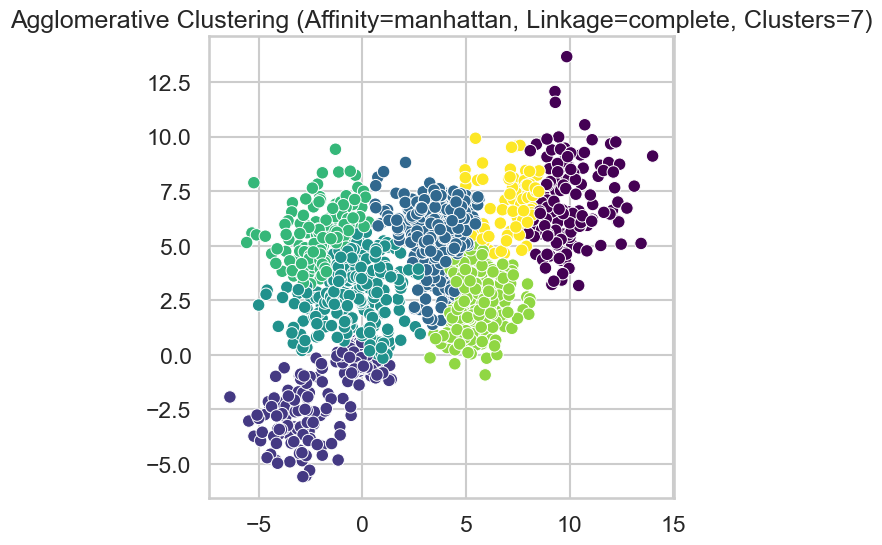

...

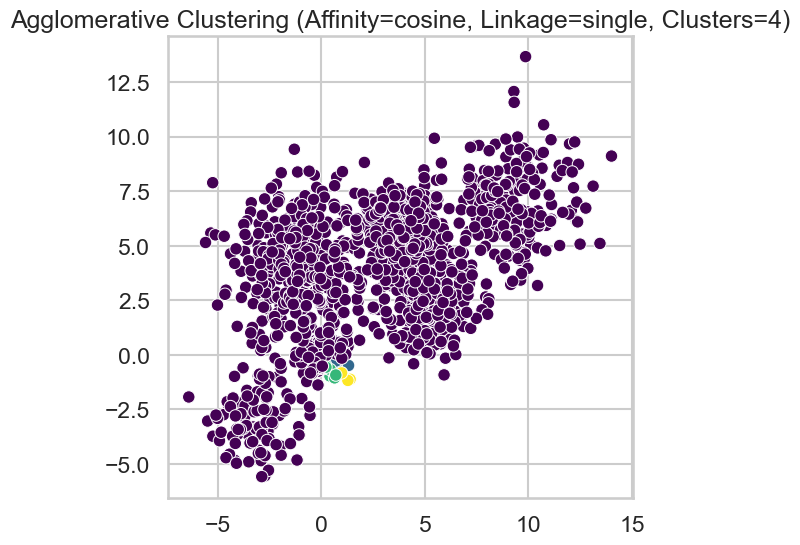

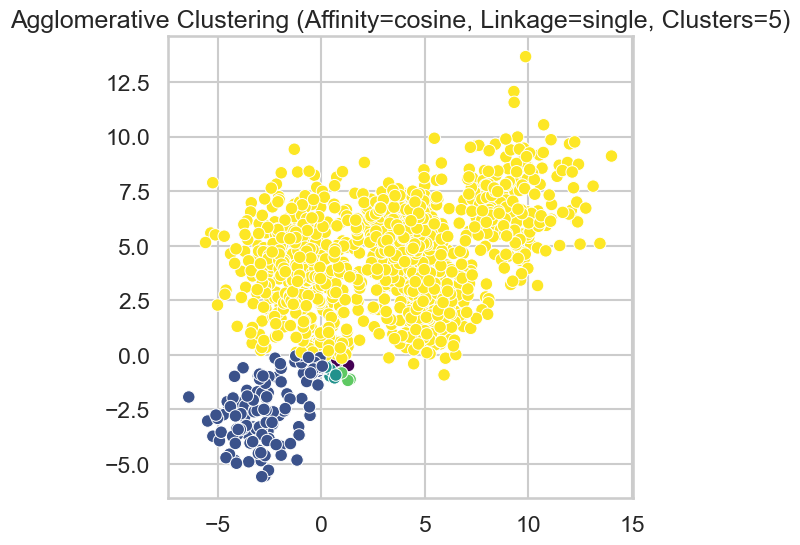

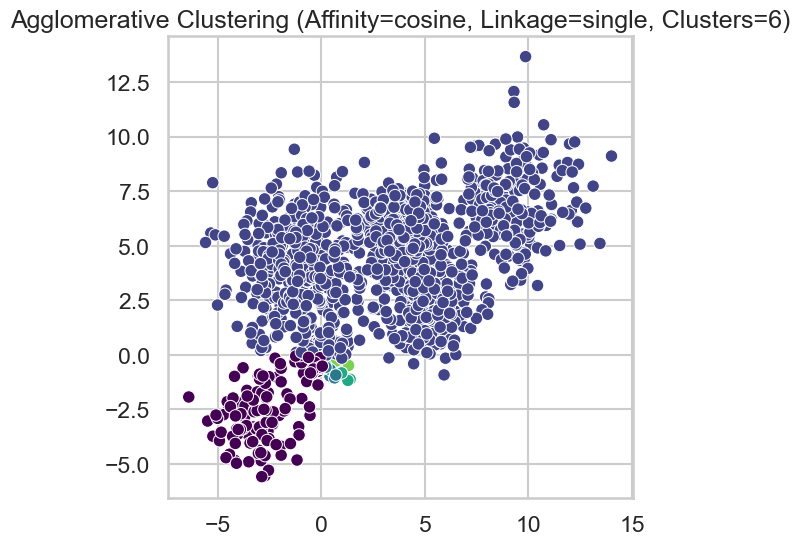

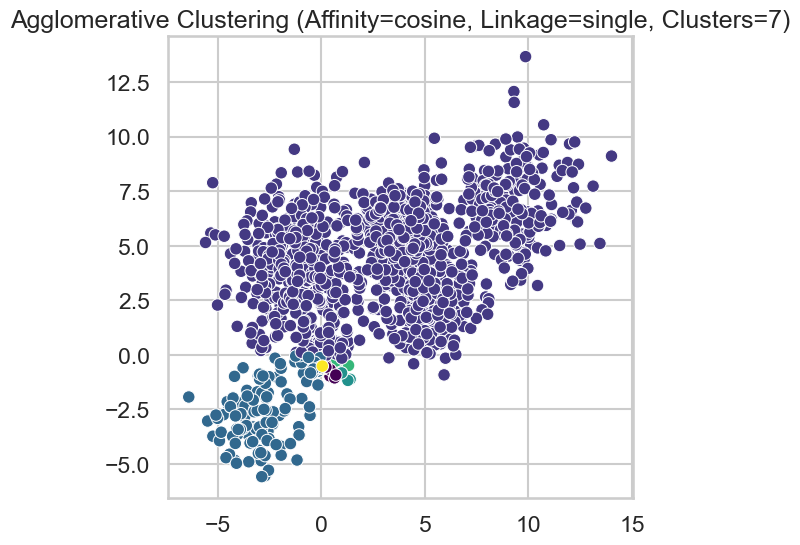

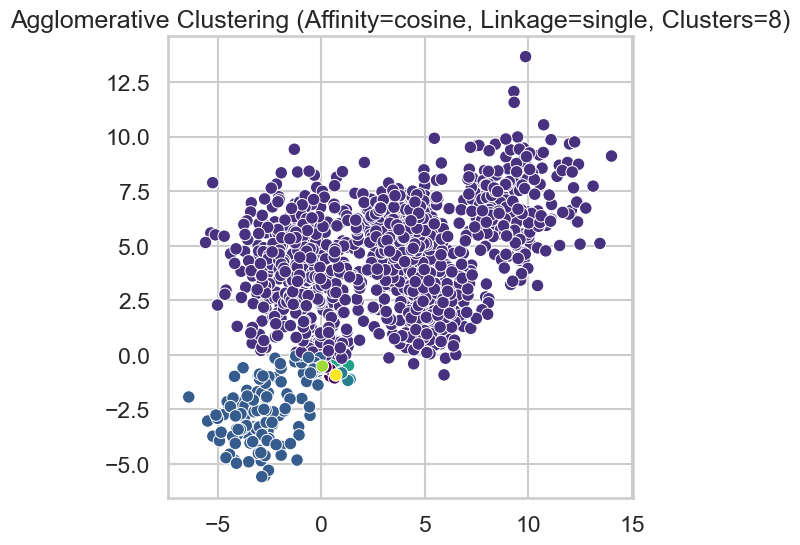

Best Silhouette Score: 0.4687 with Affinity: euclidean, Linkage: ward, and Number of Clusters: 6


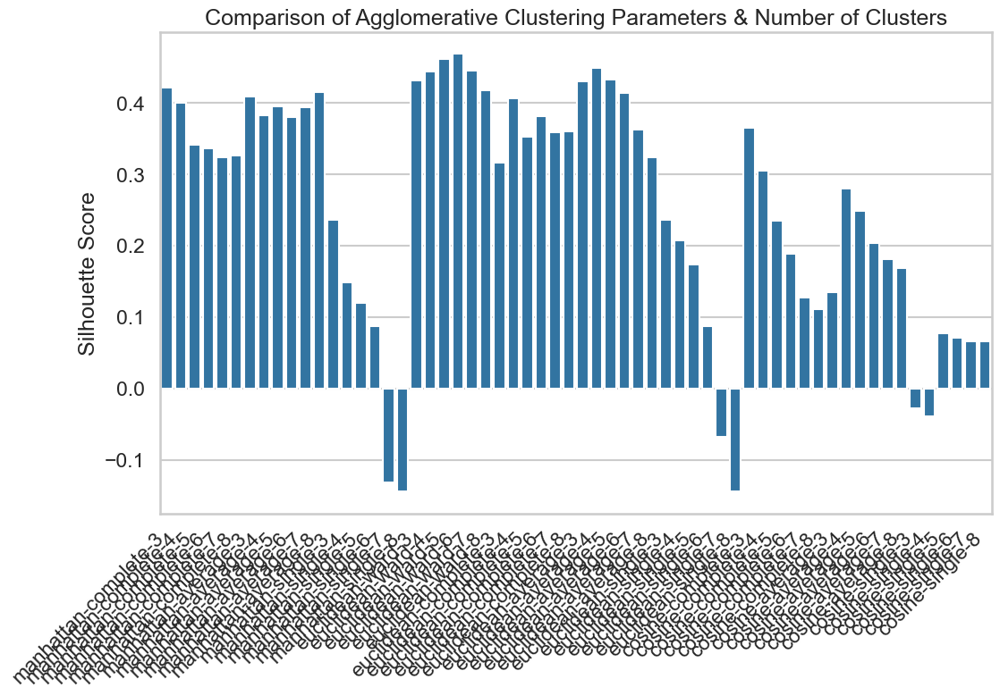

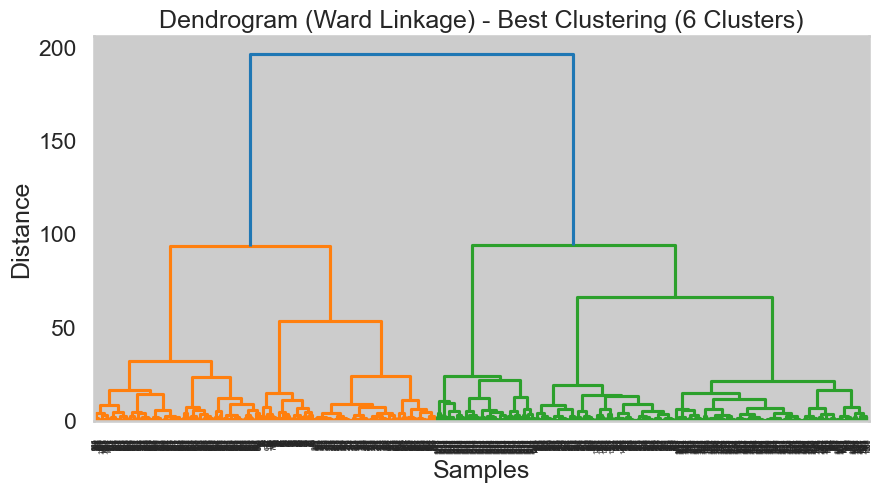

In [287]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

# Define parameters to test
affinities = ['manhattan', 'euclidean', 'cosine']
linkages = ['ward', 'complete', 'average', 'single']

# Define range of number of clusters to test
n_clusters_values = range(3, 9)  # Testing from 2 to 10 clusters

# Store best values
best_score = -1
best_n_clusters = None
best_params = None
silhouette_scores = {}

for affinity in affinities:
    for linkage_method in linkages:
        # Ward linkage only works with Euclidean distance
        if linkage_method == 'ward' and affinity != 'euclidean':
            continue
        
        for n_clusters in n_clusters_values:
            # Apply Agglomerative Clustering
            model = AgglomerativeClustering(n_clusters=n_clusters, metric=affinity, linkage=linkage_method)
            labels = model.fit_predict(Multi_blob_Data)

            # Ignore cases where all data points are in a single cluster
            if len(set(labels)) < 2:
                continue

            # Compute silhouette score
            score = silhouette_score(Multi_blob_Data, labels)
            silhouette_scores[(affinity, linkage_method, n_clusters)] = score

            if score > best_score:
                best_score = score
                best_n_clusters = n_clusters
                best_params = (affinity, linkage_method)

            # Visualize clustering
            plt.figure(figsize=(6, 6))
            sns.scatterplot(x=Multi_blob_Data[:, 0], y=Multi_blob_Data[:, 1], hue=labels, palette='viridis', legend=False)
            plt.title(f'Agglomerative Clustering (Affinity={affinity}, Linkage={linkage_method}, Clusters={n_clusters})')
            plt.show()

# Print best parameters and corresponding silhouette score
print(f"Best Silhouette Score: {best_score:.4f} with Affinity: {best_params[0]}, Linkage: {best_params[1]}, and Number of Clusters: {best_n_clusters}")

# Plot silhouette scores for different configurations
plt.figure(figsize=(12, 7))
sns.barplot(x=[f"{a}-{l}-{n}" for a, l, n in silhouette_scores.keys()], y=silhouette_scores.values())
plt.xticks(rotation=45, ha='right')
plt.ylabel("Silhouette Score")
plt.title("Comparison of Agglomerative Clustering Parameters & Number of Clusters")
plt.show()


# --------- PLOT DENDROGRAM FOR BEST CONFIGURATION ---------
if best_params:
    best_affinity, best_linkage = best_params

    # Compute linkage matrix for the best clustering configuration
    Z = linkage(Multi_blob_Data, method=best_linkage)

    # Plot dendrogram
    plt.figure(figsize=(10, 5))
    dendrogram(Z)
   # plt.axhline(y=best_n_clusters, color='r', linestyle='--')  # Add a threshold line
    plt.title(f"Dendrogram ({best_linkage.capitalize()} Linkage) - Best Clustering ({best_n_clusters} Clusters)")
    plt.xlabel("Samples")
    plt.ylabel("Distance")
    plt.show()


### DBScan
* Use DBScan function to  to cluster the above data. 
* In the  DBscan change the following parameters: 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
    * Another option: Lookup K-Distance graph method
* Plot the silhouette_score versus the variation in the EPS and the min_samples.
* Plot the resulting Clusters in this case. 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments. 

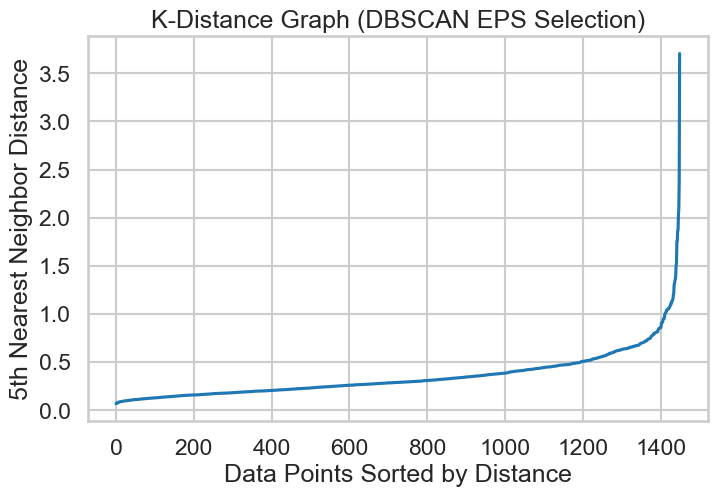

In [50]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors



# K-Distance Graph for choosing EPS
nearest_neighbors = NearestNeighbors(n_neighbors=5)
neighbors = nearest_neighbors.fit(Multi_blob_Data)
distances, indices = neighbors.kneighbors(Multi_blob_Data)

distances = np.sort(distances[:, -1])
plt.figure(figsize=(8, 5))
plt.plot(distances)
plt.xlabel("Data Points Sorted by Distance")
plt.ylabel("5th Nearest Neighbor Distance")
plt.title("K-Distance Graph (DBSCAN EPS Selection)")
plt.show()

Best Silhouette Score: 0.3052 with eps: 0.7999999999999999, min_samples: 8, and Number of Clusters: 2


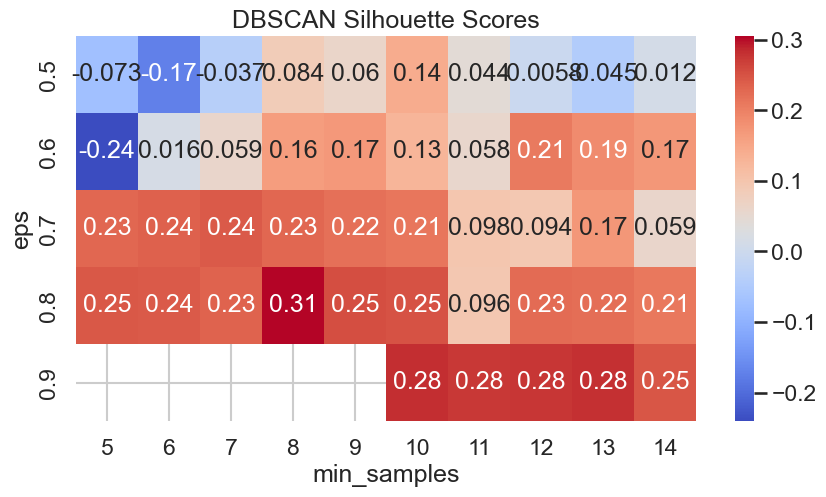

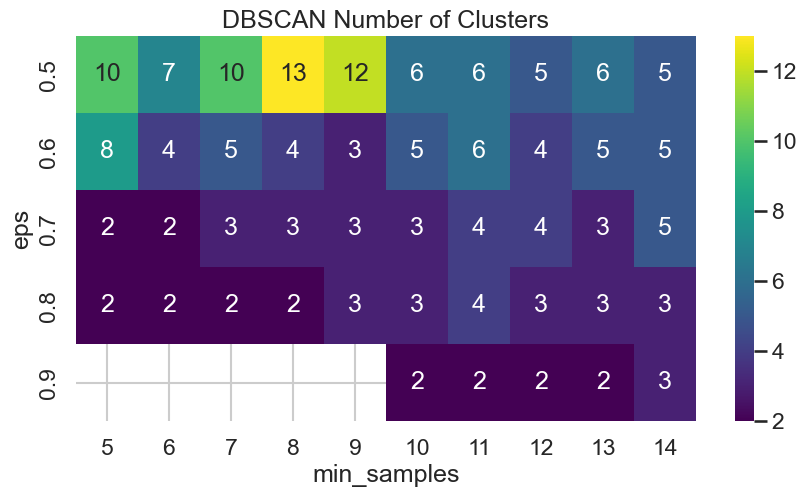

In [268]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Define parameter ranges
eps_values = np.arange(0.5, 1, 0.1)  # Adjust as needed
min_samples_values = range(5, 15)  # Adjust as needed

best_score = -1
best_params = None
silhouette_scores = {}

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(Multi_blob_Data)
        
        # Count the number of clusters (excluding noise points labeled as -1)
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        
        if num_clusters > 1:  # Silhouette score is only valid for more than 1 cluster
            score = silhouette_score(Multi_blob_Data, labels)
            silhouette_scores[(eps, min_samples)] = (score, num_clusters)
            
            if score > best_score:
                best_score = score
                best_params = (eps, min_samples, num_clusters)
            
        # Visualize clustering
        #plt.figure(figsize=(6, 6))
        #sns.scatterplot(x=Multi_blob_Data[:, 0], y=Multi_blob_Data[:, 1], hue=labels, palette='viridis', legend=False)
        #plt.title(f'DBSCAN (EPS={eps:.2f}, min_samples={min_samples})')
        #plt.show()

# Print best parameters and corresponding silhouette score
print(f"Best Silhouette Score: {best_score:.4f} with eps: {best_params[0]}, min_samples: {best_params[1]}, and Number of Clusters: {best_params[2]}")

# Prepare data for visualization
eps_list, min_samples_list, scores, clusters = zip(*[(e, m, s[0], s[1]) for (e, m), s in silhouette_scores.items()])
score_matrix = np.zeros((len(eps_values), len(min_samples_values)))
cluster_matrix = np.zeros((len(eps_values), len(min_samples_values)))

for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        if (eps, min_samples) in silhouette_scores:
            score_matrix[i, j] = silhouette_scores[(eps, min_samples)][0]
            cluster_matrix[i, j] = silhouette_scores[(eps, min_samples)][1]
        else:
            score_matrix[i, j] = np.nan
            cluster_matrix[i, j] = np.nan

# Plot silhouette score heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(score_matrix, xticklabels=min_samples_values, yticklabels=np.round(eps_values, 2), annot=True, cmap='coolwarm')
plt.xlabel("min_samples")
plt.ylabel("eps")
plt.title("DBSCAN Silhouette Scores")
plt.show()

# Plot number of clusters heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(cluster_matrix, xticklabels=min_samples_values, yticklabels=np.round(eps_values, 2), annot=True, cmap='viridis')
plt.xlabel("min_samples")
plt.ylabel("eps")
plt.title("DBSCAN Number of Clusters")
plt.show()


## conclusion
* we can see that both Kmeans clustering and agglomerative clustering suggest clustering the data into 6 clusters with silhouette scores equal to 0.49 and 0.47 .  DBSCAN achieved silhouette score of only 0.3 and clustered the data into 2 clusters, suggesting it is not suitable for this dataset.

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers. 

The data represents three classes. 


* Repeat all the above clustering approaches and steps on the above data. 
* Comment on the effect of scaling on clustering this dataset. Show the difference between clustering the data with and without   scaling.
* Compare between the different clustering approaches. 
* Is your clustering outcome consistent with the labels?

In [15]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

In [21]:
# Extract features and labels
X_iris = iris_data.data  # Features
y_iris = iris_data.target  # True labels

# Convert to DataFrame for easier analysis
iris_df = pd.DataFrame(X_iris, columns=iris_data.feature_names)
iris_df["target"] = y_iris
iris_df = iris_df.drop(columns=['target'])

# Display first few rows
iris_df.head()


,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


### preprocessing


In [24]:
#preprocessing
# check for missing values
#print(iris_df.isnull().sum())
#check if all petal width is the same value
print(np.unique(iris_df["petal width (cm)"]))
#check variance
feature_variances = iris_df.var()
# Display variances
print(feature_variances)

[0.1 0.2 0.3 0.4 0.5 0.6 1.  1.1 1.2 1.3 1.4 1.5 1.6 1.7 1.8 1.9 2.  2.1
 2.2 2.3 2.4 2.5]
sepal length (cm)    0.685694
sepal width (cm)     0.189979
petal length (cm)    3.116278
petal width (cm)     0.581006
dtype: float64


### Scaling


In [27]:
#Scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
iris_scaled = scaler.fit_transform(iris_df)

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Convert scaled data back to a DataFrame for easy plotting
iris_scaled_df = pd.DataFrame(iris_scaled, columns=iris_df.columns)

# Plot histograms before and after scaling
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8))

for i, col in enumerate(iris_df.columns):
    row, col_idx = divmod(i, 2)
    
    # Before Scaling
    sns.histplot(iris_df[col], bins=20, ax=axes[row, col_idx], color='blue', kde=True)
    axes[row, col_idx].set_title(f'Before Scaling: {col}')
    
    # After Scaling
    sns.histplot(iris_scaled_df[col], bins=20, ax=axes[row, col_idx], color='red', kde=True)
    axes[row, col_idx].set_title(f'After Scaling: {col}')

plt.tight_layout()
#plt.show()


In [29]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Boxplot Before Scaling
sns.boxplot(data=iris_df, ax=axes[0])
axes[0].set_title("Before Scaling")

# Boxplot After Scaling
sns.boxplot(data=iris_scaled_df, ax=axes[1])
axes[1].set_title("After Scaling")

#plt.xticks(rotation=45)
#plt.tight_layout()
#plt.show()


Text(0.5, 1.0, 'After Scaling')

### K-means Clustering


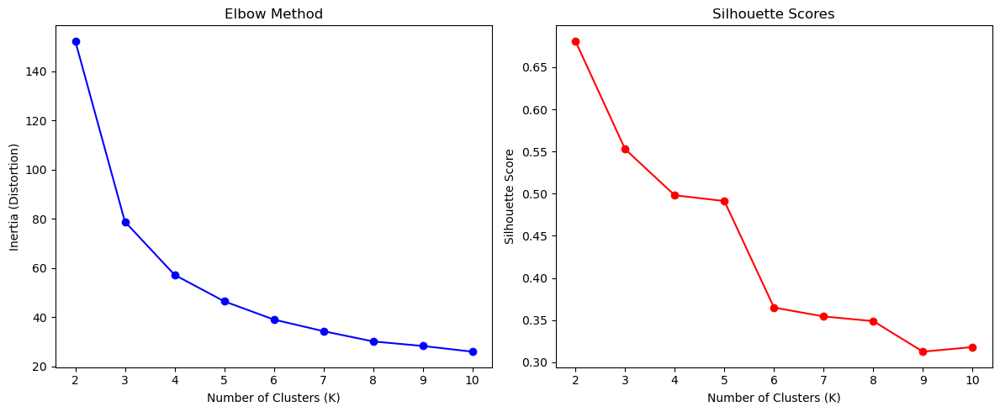

In [38]:
#Kmeans
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

# Define range for K values
K_range = range(2, 11)

# Store inertia and silhouette scores
inertia_values = []
silhouette_scores = []

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(iris_df)  # Use scaled data
    
    inertia_values.append(kmeans.inertia_)  # Inertia (for Elbow Method)
    silhouette_scores.append(silhouette_score(iris_df, cluster_labels))  # Silhouette Score

# Convert results to NumPy arrays for further analysis
inertia_values = np.array(inertia_values)
silhouette_scores = np.array(silhouette_scores)





# Create a figure with 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot Elbow Method (Inertia)
axes[0].plot(K_range, inertia_values, 'bo-')
axes[0].set_xlabel('Number of Clusters (K)')
axes[0].set_ylabel('Inertia (Distortion)')
axes[0].set_title('Elbow Method')

# Plot Silhouette Scores
axes[1].plot(K_range, silhouette_scores, 'ro-')
axes[1].set_xlabel('Number of Clusters (K)')
axes[1].set_ylabel('Silhouette Score')
axes[1].set_title('Silhouette Scores')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()



In [40]:
#visualizing clusters
# Run K-Means with the best K value
kmeans_best = KMeans(n_clusters=3, init='k-means++', random_state=42)
kmeans_labels = kmeans_best.fit_predict(iris_scaled)


# Convert scaled data to DataFrame
iris_df_scaled = pd.DataFrame(iris_scaled, columns=iris_df.columns)

# Add the cluster labels from the best K
iris_df_scaled['Cluster'] = kmeans_labels  # Assuming 'kmeans_labels' holds the labels from best K

# Pairplot to visualize clusters
sns.pairplot(iris_df_scaled, hue='Cluster', palette='bright', diag_kind='kde')
#plt.show()


In [41]:
#PCA
from sklearn.decomposition import PCA

# Reduce dimensions to 2D
pca = PCA(n_components=2)
iris_pca = pca.fit_transform(iris_scaled)

# Create DataFrame with PCA results
iris_pca_df = pd.DataFrame(iris_pca, columns=['PC1', 'PC2'])
iris_pca_df['Cluster'] = kmeans_labels  # Assign cluster labels

# Scatter plot
plt.figure(figsize=(8,6))
sns.scatterplot(x=iris_pca_df['PC1'], y=iris_pca_df['PC2'], hue=iris_pca_df['Cluster'], palette='bright')
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("K-Means Clustering Visualization using PCA")
plt.legend(title="Cluster")
#plt.show()

### K-means Clustering with scaling


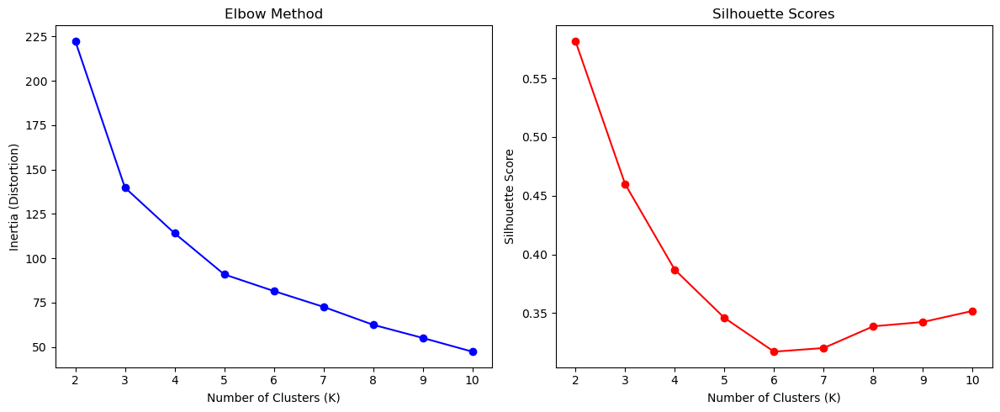

In [47]:
# Define range for K values
K_range = range(2, 11)

# Store inertia and silhouette scores
inertia_values = []
silhouette_scores = []

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(iris_scaled)  # Use scaled data
    
    inertia_values.append(kmeans.inertia_)  # Inertia (for Elbow Method)
    silhouette_scores.append(silhouette_score(iris_scaled, cluster_labels))  # Silhouette Score

# Convert results to NumPy arrays for further analysis
inertia_values = np.array(inertia_values)
silhouette_scores = np.array(silhouette_scores)





# Create a figure with 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Plot Elbow Method (Inertia)
axes[0].plot(K_range, inertia_values, 'bo-')
axes[0].set_xlabel('Number of Clusters (K)')
axes[0].set_ylabel('Inertia (Distortion)')
axes[0].set_title('Elbow Method')

# Plot Silhouette Scores
axes[1].plot(K_range, silhouette_scores, 'ro-')
axes[1].set_xlabel('Number of Clusters (K)')
axes[1].set_ylabel('Silhouette Score')
axes[1].set_title('Silhouette Scores')

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

### Agglomerative Clustering


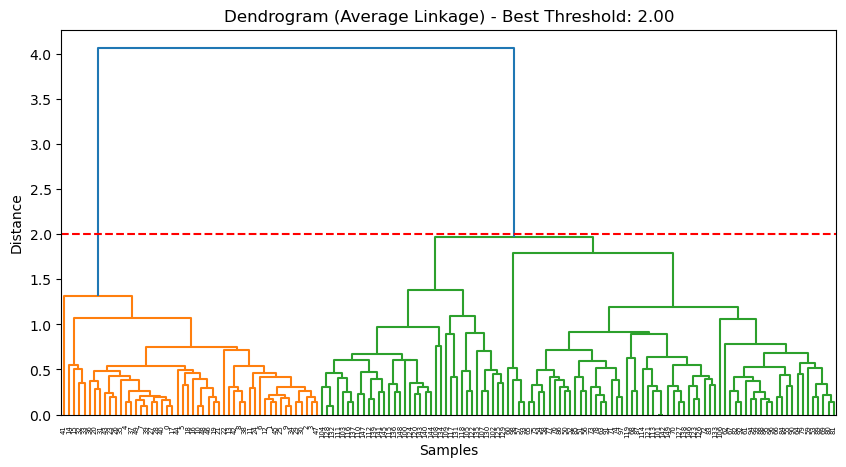

Best Silhouette Score: 0.6867 with Affinity: euclidean, Linkage: average, and Distance Threshold: 2.00


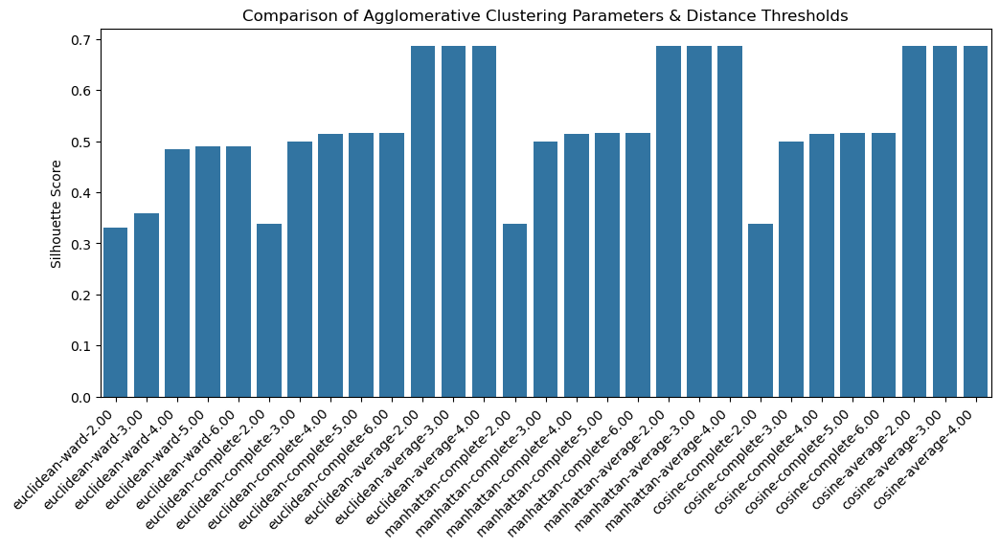

In [68]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.metrics import silhouette_score

# Define parameters to test
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['ward', 'complete', 'average', 'single']

# Define range of distance thresholds to test
distance_thresholds =[2,3,4,5,6]# Adjust the range as needed

# Store best values
best_score = -1
best_threshold = None
best_params = None
silhouette_scores = {}

for affinity in affinities:
    for linkage_method in linkages:
        # Ward linkage only works with Euclidean distance
        if linkage_method == 'ward' and affinity != 'euclidean':
            continue
        
        Z = linkage(iris_df, method=linkage_method)  # Generate linkage matrix

        for threshold in distance_thresholds:
            labels = fcluster(Z, t=threshold, criterion='distance')  # Cluster using threshold

            # Ignore cases where all data points are in a single cluster
            if len(set(labels)) < 2:
                continue

            score = silhouette_score(iris_df, labels)
            silhouette_scores[(affinity, linkage_method, threshold)] = score

            if score > best_score:
                best_score = score
                best_threshold = threshold
                best_params = (affinity, linkage_method)

# Plot dendrogram with best threshold
plt.figure(figsize=(10, 5))
Z = linkage(iris_df, method=best_params[1])
dendrogram(Z)
plt.axhline(y=best_threshold, color='r', linestyle='--')  # Best threshold line
plt.title(f"Dendrogram ({best_params[1].capitalize()} Linkage) - Best Threshold: {best_threshold:.2f}")
plt.xlabel("Samples")
plt.ylabel("Distance")
plt.show()

# Print best parameters and corresponding silhouette score
print(f"Best Silhouette Score: {best_score:.4f} with Affinity: {best_params[0]}, Linkage: {best_params[1]}, and Distance Threshold: {best_threshold:.2f}")

# Plot silhouette scores for different configurations
plt.figure(figsize=(12, 5))
sns.barplot(x=[f"{a}-{l}-{t:.2f}" for a, l, t in silhouette_scores.keys()], y=silhouette_scores.values())
plt.xticks(rotation=45, ha='right')
plt.ylabel("Silhouette Score")
plt.title("Comparison of Agglomerative Clustering Parameters & Distance Thresholds")
plt.show()


### Agglomerative Clustering with scaling


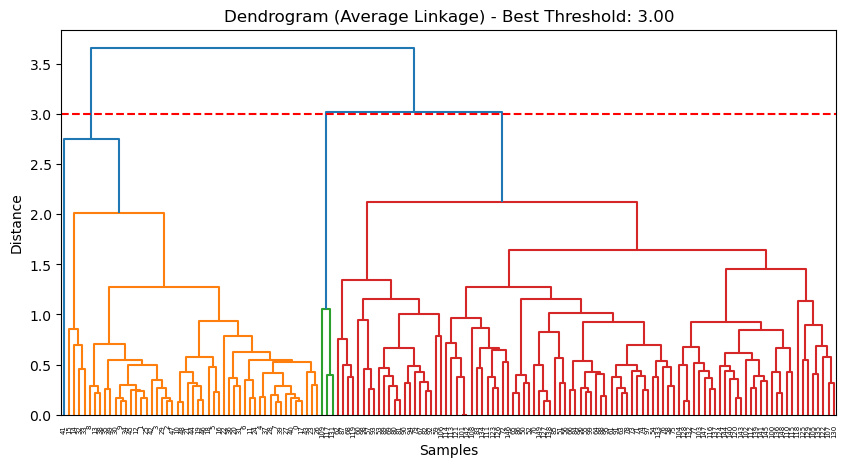

Best Silhouette Score: 0.4803 with Affinity: euclidean, Linkage: average, and Distance Threshold: 3.00


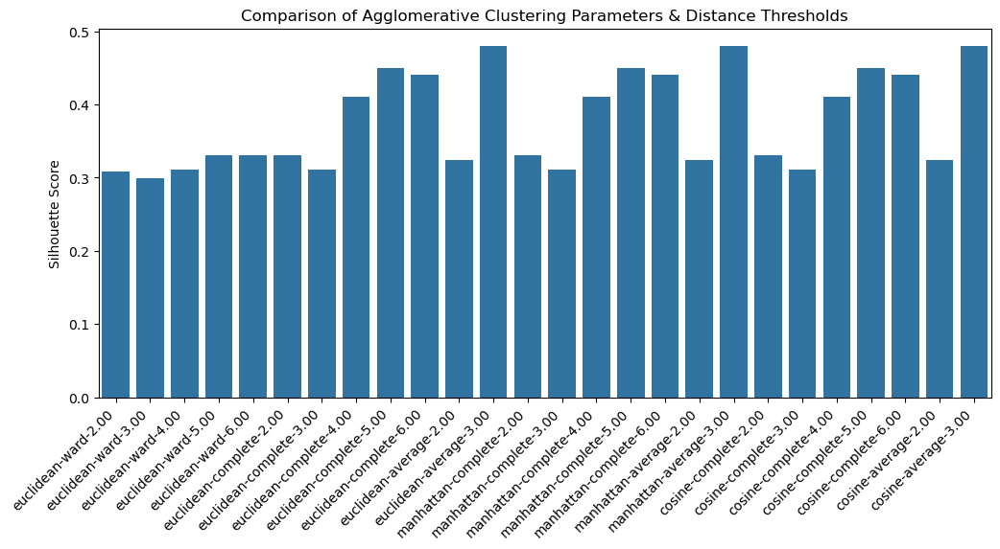

In [71]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.metrics import silhouette_score

# Define parameters to test
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['ward', 'complete', 'average', 'single']

# Define range of distance thresholds to test
distance_thresholds = [2,3,4,5,6]  # Adjust the range as needed

# Store best values
best_score = -1
best_threshold = None
best_params = None
silhouette_scores = {}

for affinity in affinities:
    for linkage_method in linkages:
        # Ward linkage only works with Euclidean distance
        if linkage_method == 'ward' and affinity != 'euclidean':
            continue
        
        Z = linkage(iris_scaled, method=linkage_method)  # Generate linkage matrix

        for threshold in distance_thresholds:
            labels = fcluster(Z, t=threshold, criterion='distance')  # Cluster using threshold

            # Ignore cases where all data points are in a single cluster
            if len(set(labels)) < 2:
                continue

            score = silhouette_score(iris_scaled, labels)
            silhouette_scores[(affinity, linkage_method, threshold)] = score

            if score > best_score:
                best_score = score
                best_threshold = threshold
                best_params = (affinity, linkage_method)

# Plot dendrogram with best threshold
plt.figure(figsize=(10, 5))
Z = linkage(iris_scaled, method=best_params[1])
dendrogram(Z)
plt.axhline(y=best_threshold, color='r', linestyle='--')  # Best threshold line
plt.title(f"Dendrogram ({best_params[1].capitalize()} Linkage) - Best Threshold: {best_threshold:.2f}")
plt.xlabel("Samples")
plt.ylabel("Distance")
plt.show()

# Print best parameters and corresponding silhouette score
print(f"Best Silhouette Score: {best_score:.4f} with Affinity: {best_params[0]}, Linkage: {best_params[1]}, and Distance Threshold: {best_threshold:.2f}")

# Plot silhouette scores for different configurations
plt.figure(figsize=(12, 5))
sns.barplot(x=[f"{a}-{l}-{t:.2f}" for a, l, t in silhouette_scores.keys()], y=silhouette_scores.values())
plt.xticks(rotation=45, ha='right')
plt.ylabel("Silhouette Score")
plt.title("Comparison of Agglomerative Clustering Parameters & Distance Thresholds")
plt.show()


### DBSCAN


### Tuning


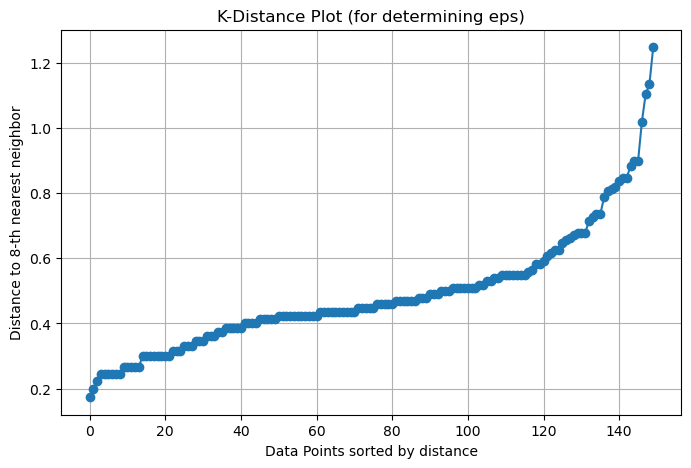

In [80]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors

# Define min_samples
min_samples = 8  # As we have 4 features, 2 * features = 8

# Compute the distances to the k-th nearest neighbor
nbrs = NearestNeighbors(n_neighbors=min_samples)
nbrs.fit(iris_df)  # Use the scaled dataset
distances, indices = nbrs.kneighbors(iris_df)

# Sort distances and plot
sorted_distances = np.sort(distances[:, -1])  # Take the k-th nearest distance

plt.figure(figsize=(8, 5))
plt.plot(sorted_distances, marker='o', linestyle='-')
plt.xlabel("Data Points sorted by distance")
plt.ylabel(f"Distance to {min_samples}-th nearest neighbor")
plt.title("K-Distance Plot (for determining eps)")
plt.grid()
plt.show()


### clustering


Best Silhouette Score: 0.6867 with eps: 0.8999999999999999, min_samples: 6, and Number of Clusters: 2


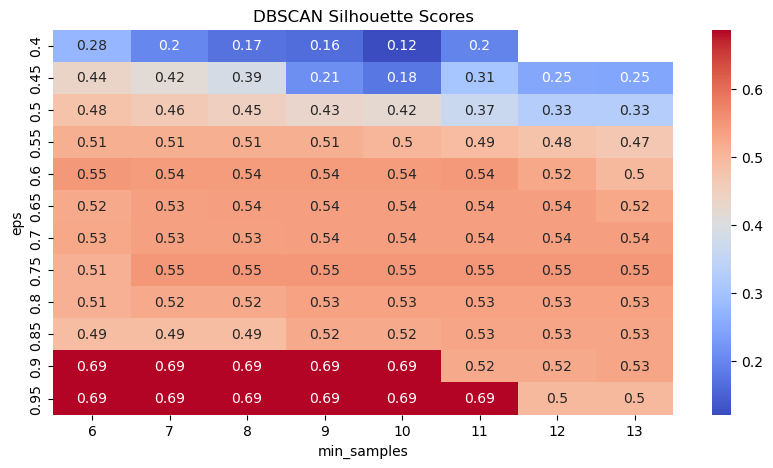

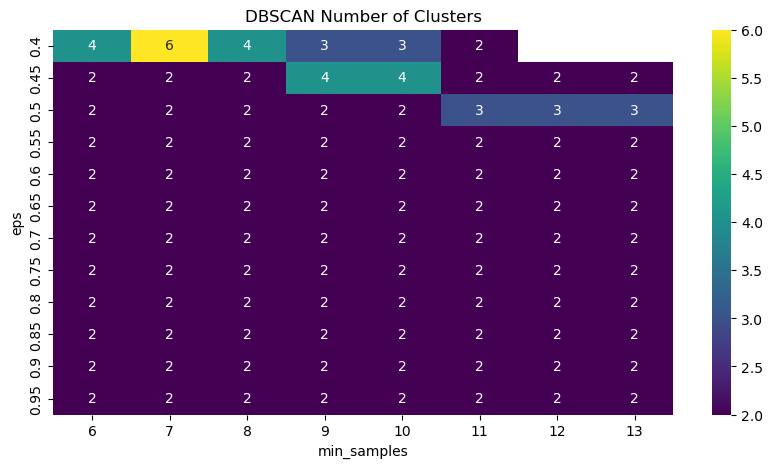

In [249]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Define parameter ranges
eps_values = np.arange(0.4, 1, 0.05)  # Adjust as needed
min_samples_values = range(6, 14)  # Adjust as needed

best_score = -1
best_params = None
silhouette_scores = {}

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(iris_df)
        
        # Count the number of clusters (excluding noise points labeled as -1)
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        
        if num_clusters > 1:  # Silhouette score is only valid for more than 1 cluster
            score = silhouette_score(iris_df, labels)
            silhouette_scores[(eps, min_samples)] = (score, num_clusters)
            
            if score > best_score:
                best_score = score
                best_params = (eps, min_samples, num_clusters)

# Print best parameters and corresponding silhouette score
print(f"Best Silhouette Score: {best_score:.4f} with eps: {best_params[0]}, min_samples: {best_params[1]}, and Number of Clusters: {best_params[2]}")

# Prepare data for visualization
eps_list, min_samples_list, scores, clusters = zip(*[(e, m, s[0], s[1]) for (e, m), s in silhouette_scores.items()])
score_matrix = np.zeros((len(eps_values), len(min_samples_values)))
cluster_matrix = np.zeros((len(eps_values), len(min_samples_values)))

for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        if (eps, min_samples) in silhouette_scores:
            score_matrix[i, j] = silhouette_scores[(eps, min_samples)][0]
            cluster_matrix[i, j] = silhouette_scores[(eps, min_samples)][1]
        else:
            score_matrix[i, j] = np.nan
            cluster_matrix[i, j] = np.nan

# Plot silhouette score heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(score_matrix, xticklabels=min_samples_values, yticklabels=np.round(eps_values, 2), annot=True, cmap='coolwarm')
plt.xlabel("min_samples")
plt.ylabel("eps")
plt.title("DBSCAN Silhouette Scores")
plt.show()

# Plot number of clusters heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(cluster_matrix, xticklabels=min_samples_values, yticklabels=np.round(eps_values, 2), annot=True, cmap='viridis')
plt.xlabel("min_samples")
plt.ylabel("eps")
plt.title("DBSCAN Number of Clusters")
plt.show()


### Tuning for scaled Dataset


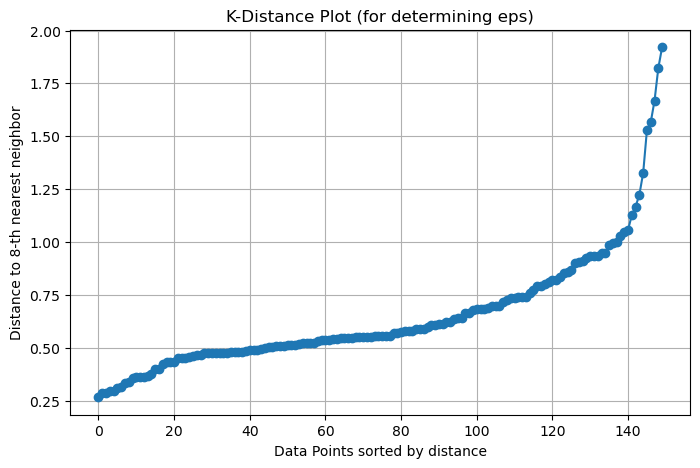

In [253]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors

# Define min_samples
min_samples = 8  # As we have 4 features, 2 * features = 8

# Compute the distances to the k-th nearest neighbor
nbrs = NearestNeighbors(n_neighbors=min_samples)
nbrs.fit(iris_scaled)  # Use the scaled dataset
distances, indices = nbrs.kneighbors(iris_scaled)

# Sort distances and plot
sorted_distances = np.sort(distances[:, -1])  # Take the k-th nearest distance

plt.figure(figsize=(8, 5))
plt.plot(sorted_distances, marker='o', linestyle='-')
plt.xlabel("Data Points sorted by distance")
plt.ylabel(f"Distance to {min_samples}-th nearest neighbor")
plt.title("K-Distance Plot (for determining eps)")
plt.grid()
plt.show()

### clustering for scaled Dataset


Best Silhouette Score: 0.5818 with eps: 1.4, min_samples: 6, and Number of Clusters: 2


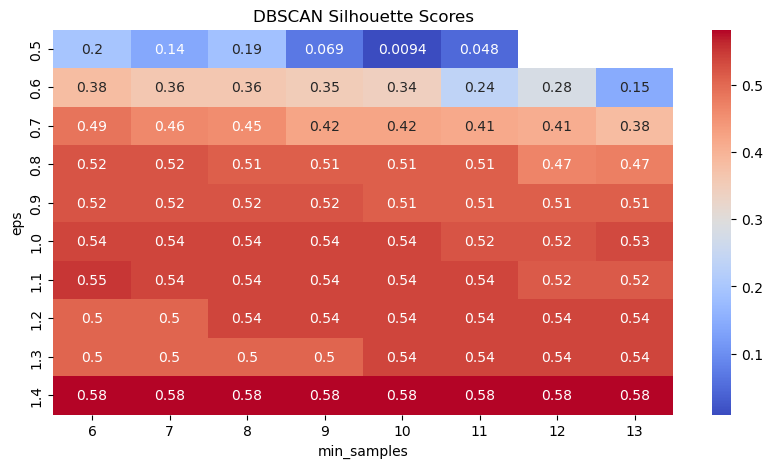

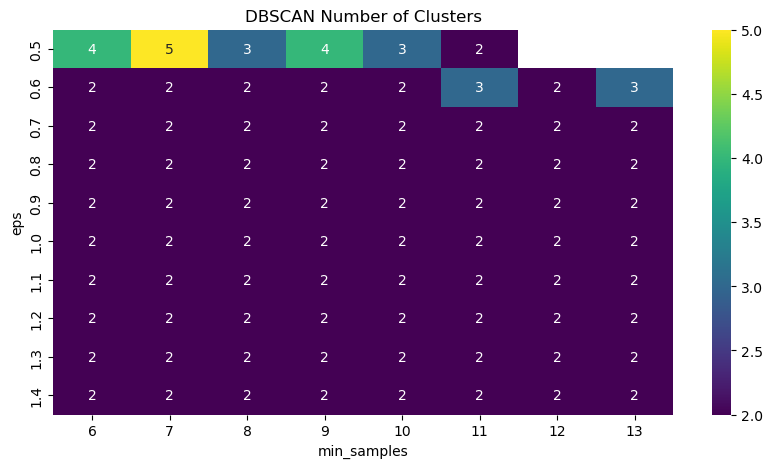

In [255]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Define parameter ranges
eps_values = np.arange(0.5, 1.5, 0.1)  # Adjust as needed
min_samples_values = range(6, 14)  # Adjust as needed

best_score = -1
best_params = None
silhouette_scores = {}

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(iris_scaled)
        
        # Count the number of clusters (excluding noise points labeled as -1)
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        
        if num_clusters > 1:  # Silhouette score is only valid for more than 1 cluster
            score = silhouette_score(iris_scaled, labels)
            silhouette_scores[(eps, min_samples)] = (score, num_clusters)
            
            if score > best_score:
                best_score = score
                best_params = (eps, min_samples, num_clusters)

# Print best parameters and corresponding silhouette score
print(f"Best Silhouette Score: {best_score:.4f} with eps: {best_params[0]}, min_samples: {best_params[1]}, and Number of Clusters: {best_params[2]}")

# Prepare data for visualization
eps_list, min_samples_list, scores, clusters = zip(*[(e, m, s[0], s[1]) for (e, m), s in silhouette_scores.items()])
score_matrix = np.zeros((len(eps_values), len(min_samples_values)))
cluster_matrix = np.zeros((len(eps_values), len(min_samples_values)))

for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        if (eps, min_samples) in silhouette_scores:
            score_matrix[i, j] = silhouette_scores[(eps, min_samples)][0]
            cluster_matrix[i, j] = silhouette_scores[(eps, min_samples)][1]
        else:
            score_matrix[i, j] = np.nan
            cluster_matrix[i, j] = np.nan

# Plot silhouette score heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(score_matrix, xticklabels=min_samples_values, yticklabels=np.round(eps_values, 2), annot=True, cmap='coolwarm')
plt.xlabel("min_samples")
plt.ylabel("eps")
plt.title("DBSCAN Silhouette Scores")
plt.show()

# Plot number of clusters heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(cluster_matrix, xticklabels=min_samples_values, yticklabels=np.round(eps_values, 2), annot=True, cmap='viridis')
plt.xlabel("min_samples")
plt.ylabel("eps")
plt.title("DBSCAN Number of Clusters")
plt.show()


## Conclusion
by using the elbow method and examining silhouette scores, kmeans suggests using 3 clusters. Agglomerative clustering without and with scaling both suggested clustering the data into 3 clusters with high silhouette scores. DBSCAN suggested clustering the data into 2 clusters.

The values of silhouette scores became smaller after using scaling

## Customer dataset
Repeat all the above on the customer data set 

In [211]:
cust_df = pd.read_csv(r"C:\Users\DELL\Desktop\MachineLearning\Project\Customer data.csv")
cust_df

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1
...,...,...,...,...,...,...,...,...
1995,100001996,1,0,47,1,123525,0,0
1996,100001997,1,1,27,1,117744,1,0
1997,100001998,0,0,31,0,86400,0,0
1998,100001999,1,1,24,1,97968,0,0


In [213]:
#we do not need ID column
cust_df=cust_df.drop(['ID'],axis=1)
cust_df.head()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,0,0,67,2,124670,1,2
1,1,1,22,1,150773,1,2
2,0,0,49,1,89210,0,0
3,0,0,45,1,171565,1,1
4,0,0,53,1,149031,1,1


In [215]:
# checking for null values
cust_df.isnull().sum()

Sex                0
Marital status     0
Age                0
Education          0
Income             0
Occupation         0
Settlement size    0
dtype: int64

## Note
This dataset has a binary features so we will apply MinMax scaling. As MinMax scaling is useful in the context of distance-based clustering methods like DBSCAN, K-Means, and Agglomerative

In [217]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

# Apply scaling to the dataset
cust_df[:] = scaler.fit_transform(cust_df)


cust_df.head()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,0,0,0.844828,0.666667,0.324781,0.5,1.0
1,1,1,0.068966,0.333333,0.420210,0.5,1.0
2,0,0,0.534483,0.333333,0.195144,0.0,0.0
3,0,0,0.465517,0.333333,0.496223,0.5,0.5
4,0,0,0.603448,0.333333,0.413842,0.5,0.5


## Kmeans

<Figure size 1000x500 with 0 Axes>

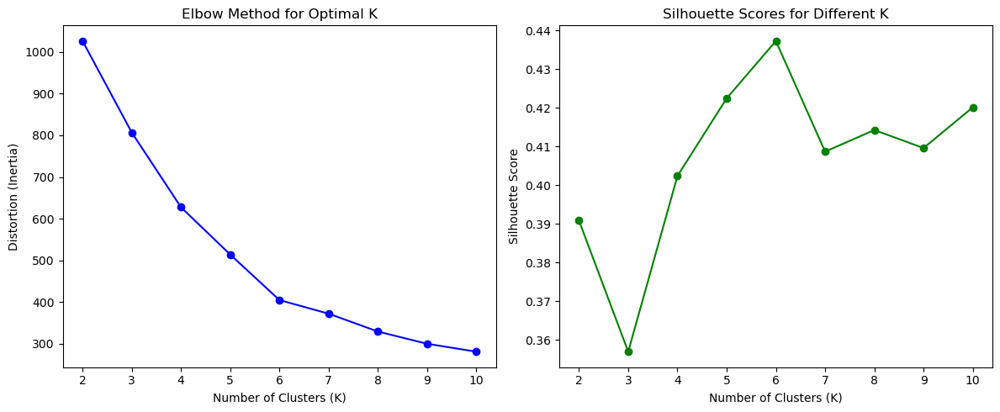

Best K according to Silhouette Score: 6 with score: 0.4373


In [220]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Define range for K values
K_range = range(2, 11)
distortions = []
silhouette_scores = []

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(cust_df)
    
    # Compute distortion (Inertia)
    distortions.append(kmeans.inertia_)
    
    # Compute Silhouette Score
    score = silhouette_score(cust_df, labels)
    silhouette_scores.append(score)

# Find the best K based on the highest silhouette score
best_K = K_range[np.argmax(silhouette_scores)]
best_silhouette = max(silhouette_scores)

# Plot Elbow Method
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(K_range, distortions, marker='o', linestyle='-', color='b')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Distortion (Inertia)")
plt.title("Elbow Method for Optimal K")

# Plot Silhouette Scores
plt.subplot(1, 2, 2)
plt.plot(K_range, silhouette_scores, marker='o', linestyle='-', color='g')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different K")

plt.tight_layout()
plt.show()

print(f"Best K according to Silhouette Score: {best_K} with score: {best_silhouette:.4f}")


## Agglomerative clustering


by investigating the dendogram and looking for the longest vertical lines to find large gaps we adjusted the values of distance thresholds 

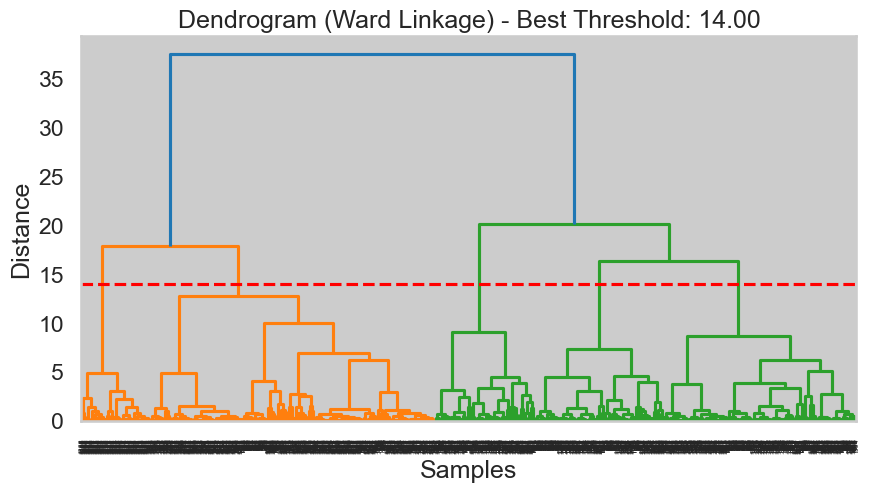

Best Silhouette Score: 0.3993 with Affinity: euclidean, Linkage: ward, and Distance Threshold: 14.00


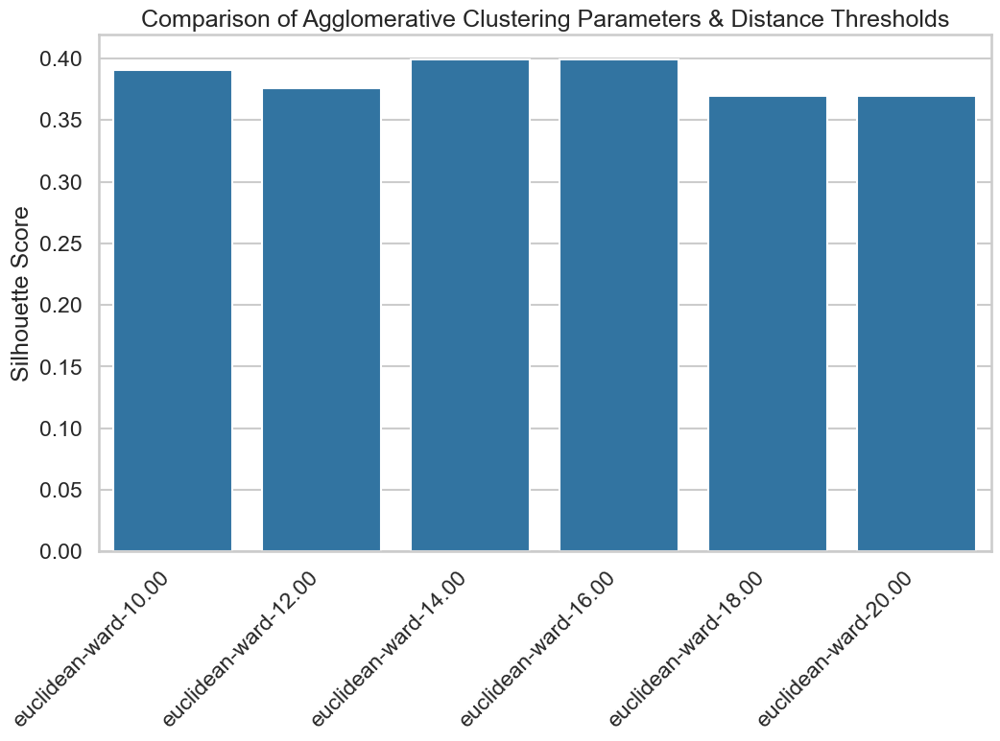

In [295]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.metrics import silhouette_score

# Define parameters to test
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['ward', 'complete', 'average', 'single']

# Define range of distance thresholds to test
distance_thresholds = [10, 12, 14, 16, 18, 20] # Adjust the range as needed

# Store best values
best_score = -1
best_threshold = None
best_params = None
silhouette_scores = {}

for affinity in affinities:
    for linkage_method in linkages:
        # Ward linkage only works with Euclidean distance
        if linkage_method == 'ward' and affinity != 'euclidean':
            continue
        
        Z = linkage(cust_df, method=linkage_method)  # Generate linkage matrix

        for threshold in distance_thresholds:
            labels = fcluster(Z, t=threshold, criterion='distance')  # Cluster using threshold

            # Ignore cases where all data points are in a single cluster
            if len(set(labels)) < 2:
                continue

            score = silhouette_score(cust_df, labels)
            silhouette_scores[(affinity, linkage_method, threshold)] = score

            if score > best_score:
                best_score = score
                best_threshold = threshold
                best_params = (affinity, linkage_method)

# Plot dendrogram with best threshold
plt.figure(figsize=(10, 5))
Z = linkage(cust_df, method=best_params[1])
dendrogram(Z)
plt.axhline(y=best_threshold, color='r', linestyle='--')  # Best threshold line
plt.title(f"Dendrogram ({best_params[1].capitalize()} Linkage) - Best Threshold: {best_threshold:.2f}")
plt.xlabel("Samples")
plt.ylabel("Distance")
plt.show()

# Print best parameters and corresponding silhouette score
print(f"Best Silhouette Score: {best_score:.4f} with Affinity: {best_params[0]}, Linkage: {best_params[1]}, and Distance Threshold: {best_threshold:.2f}")

# Plot silhouette scores for different configurations
plt.figure(figsize=(12, 7))
sns.barplot(x=[f"{a}-{l}-{t:.2f}" for a, l, t in silhouette_scores.keys()], y=silhouette_scores.values())
plt.xticks(rotation=45, ha='right')
plt.ylabel("Silhouette Score")
plt.title("Comparison of Agglomerative Clustering Parameters & Distance Thresholds")
plt.show()


## DBScan

## Tuning

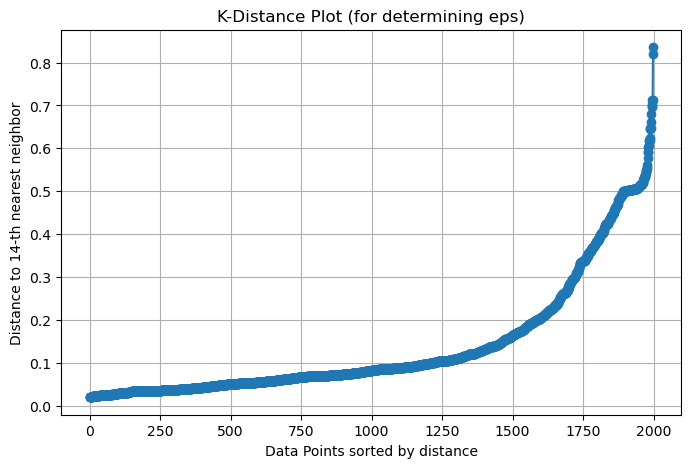

In [233]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors

# Define min_samples
min_samples = 14  # As we have 7 features, 2 * features = 14

# Compute the distances to the k-th nearest neighbor
nbrs = NearestNeighbors(n_neighbors=min_samples)
nbrs.fit(cust_df)  # Use the scaled dataset
distances, indices = nbrs.kneighbors(cust_df)

# Sort distances and plot
sorted_distances = np.sort(distances[:, -1])  # Take the k-th nearest distance

plt.figure(figsize=(8, 5))
plt.plot(sorted_distances, marker='o', linestyle='-')
plt.xlabel("Data Points sorted by distance")
plt.ylabel(f"Distance to {min_samples}-th nearest neighbor")
plt.title("K-Distance Plot (for determining eps)")
plt.grid()
plt.show()


## clustering


Best Silhouette Score: 0.5552 with eps: 0.30000000000000004, min_samples: 10, and Number of Clusters: 37


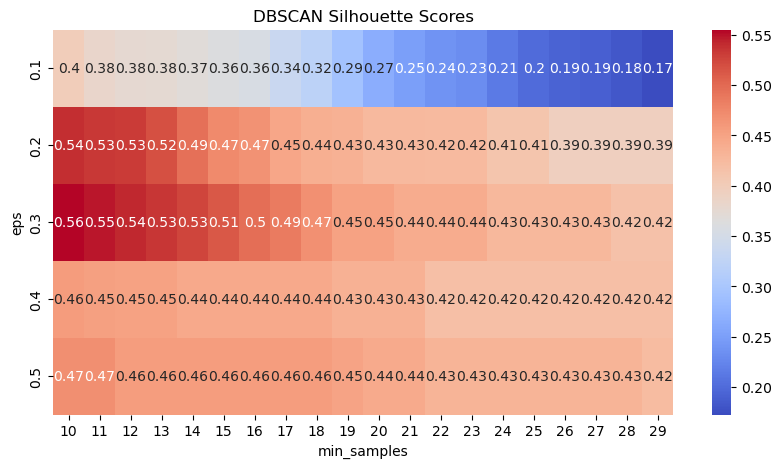

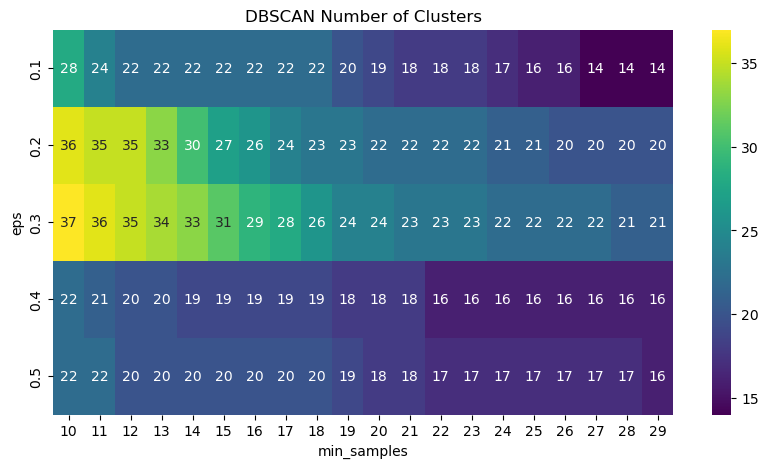

In [236]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Define parameter ranges
eps_values = np.arange(0.1, 0.6, 0.1)  # Adjust as needed
min_samples_values = range(10, 30)  # Adjust as needed

best_score = -1
best_params = None
silhouette_scores = {}

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(cust_df)
        
        # Count the number of clusters (excluding noise points labeled as -1)
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        
        if num_clusters > 1:  # Silhouette score is only valid for more than 1 cluster
            score = silhouette_score(df, labels)
            silhouette_scores[(eps, min_samples)] = (score, num_clusters)
            
            if score > best_score:
                best_score = score
                best_params = (eps, min_samples, num_clusters)

# Print best parameters and corresponding silhouette score
print(f"Best Silhouette Score: {best_score:.4f} with eps: {best_params[0]}, min_samples: {best_params[1]}, and Number of Clusters: {best_params[2]}")

# Prepare data for visualization
eps_list, min_samples_list, scores, clusters = zip(*[(e, m, s[0], s[1]) for (e, m), s in silhouette_scores.items()])
score_matrix = np.zeros((len(eps_values), len(min_samples_values)))
cluster_matrix = np.zeros((len(eps_values), len(min_samples_values)))

for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        if (eps, min_samples) in silhouette_scores:
            score_matrix[i, j] = silhouette_scores[(eps, min_samples)][0]
            cluster_matrix[i, j] = silhouette_scores[(eps, min_samples)][1]
        else:
            score_matrix[i, j] = np.nan
            cluster_matrix[i, j] = np.nan

# Plot silhouette score heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(score_matrix, xticklabels=min_samples_values, yticklabels=np.round(eps_values, 2), annot=True, cmap='coolwarm')
plt.xlabel("min_samples")
plt.ylabel("eps")
plt.title("DBSCAN Silhouette Scores")
plt.show()

# Plot number of clusters heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(cluster_matrix, xticklabels=min_samples_values, yticklabels=np.round(eps_values, 2), annot=True, cmap='viridis')
plt.xlabel("min_samples")
plt.ylabel("eps")
plt.title("DBSCAN Number of Clusters")
plt.show()


## Conclusion
DBSCAN achieved the highest silhouette score of 0.56, however is suggests clustering the data into 37 clusters which is not realistic. 
kmeans and agglomerative clustering achieved close results by suggesting to cluster the data into 6 and 5 clusters.
However kmeans achieved higher silhouette score (0.44) more than kmeans (0.4), which suggests clustering the data into 6 clusters.